In [1]:
import pandas as pd
import warnings
from causalnex.structure import StructureModel
from IPython.display import Image
from causalnex.plots import plot_structure, NODE_STYLE, EDGE_STYLE
import CausalnexDataset as cd


file = '../../../datasets/preprocess_lightsail2/lightsail_dataset.csv'
a = cd.CausalnexDataset(dataset=file, delimiter_char=",", columns_to_drop=["time"], threshold=18, dropna=True)

C:\ProgramData\Anaconda3\lib\site-packages\causalnex\structure\notears.py:436: UserWarning: Failed to converge. Consider increasing max_iter.
  warnings.warn("Failed to converge. Consider increasing max_iter.")


Run Image(result.draw(format='png')) to draw the graph


C:\ProgramData\Anaconda3\lib\site-packages\pygraphviz\agraph.py:1400: RuntimeWarning: Warning: node 'atmelPwr_curr', graph '' size too small for label

  warnings.warn(b"".join(errors).decode(self.encoding), RuntimeWarning)
C:\ProgramData\Anaconda3\lib\site-packages\pygraphviz\agraph.py:1400: RuntimeWarning: Warning: node 'atmelPwr_curr', graph '' size too small for label

  warnings.warn(b"".join(errors).decode(self.encoding), RuntimeWarning)


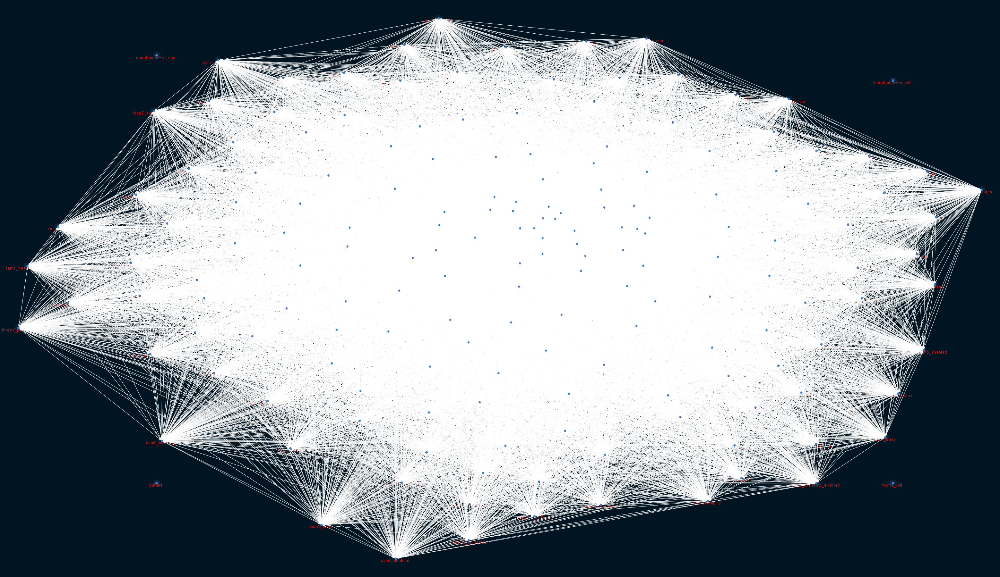

In [3]:

viz = a.get_graph()
Image(viz.draw(format="png"))

In [2]:
# Puesto que este dataset contiene muchos más datos que el dataset de Mars Express, no podremos analizar todos los datos en un solo grafo
# Aislaremos un subgrafo con un grupo de datos que nos interese analizar, por ejemplo la temperatura de las baterías.
a.reset_threshold(0)


nodes = a.get_all_nodes()
batteries_tmp = [x for x in nodes if "battery" in x and "_tmp" in x ]
df = a.edges_to_dataframe(specific_nodes=batteries_tmp).sort_values(["weight"], ascending=False)
df.describe()

,weight
count,2.293000e+03
mean,3.237237e-03
std,4.814010e-02
min,4.205907e-14
25%,1.049840e-09
50%,2.466266e-07
75%,1.373092e-06
max,8.191247e-01


C:\ProgramData\Anaconda3\lib\site-packages\causalnex\structure\notears.py:436: UserWarning: Failed to converge. Consider increasing max_iter.
  warnings.warn("Failed to converge. Consider increasing max_iter.")


Run Image(result.draw(format='png')) to draw the graph


C:\ProgramData\Anaconda3\lib\site-packages\pygraphviz\agraph.py:1400: RuntimeWarning: Warning: node 'battery0_tmp', graph '' size too small for label

  warnings.warn(b"".join(errors).decode(self.encoding), RuntimeWarning)


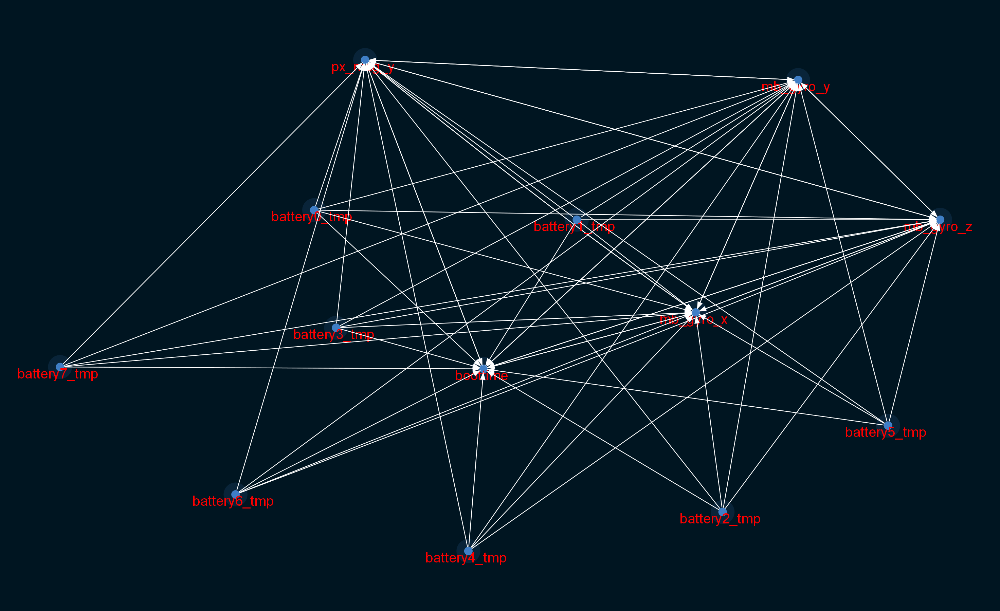

In [3]:
mean = 3.237237e-03
a.reset_threshold(mean)
viz = a.get_graph(specific_nodes=batteries_tmp)
Image(viz.draw(format="png"))

In [4]:
#Como podemos observar, según el algoritmo NOTEARS, la temperatura de las baterías influye sobretodo en el tiempo de arranque (boottime), en las posiciones de los giroscopios (mb_gyro) y en los magentómetros (px_mag_y).
a.edges_to_dataframe(specific_nodes=batteries_tmp).sort_values(["weight"], ascending=False)

,source,target,weight
4,battery1_tmp,boottime,0.819125
0,battery0_tmp,boottime,0.818909
8,battery2_tmp,boottime,0.818840
12,battery3_tmp,boottime,0.818705
21,battery5_tmp,boottime,0.809068
16,battery4_tmp,boottime,0.808883
31,battery7_tmp,boottime,0.807227
26,battery6_tmp,boottime,0.806720
27,battery6_tmp,mb_gyro_x,0.071699
32,battery7_tmp,mb_gyro_x,0.071626


In [5]:
# El umbral utilizado nos ha dejado fuera las relaciones que influyen en la temperatura de las baterías, así que vamos a buscar un umbral que no nos las omita.
# De momento utilizaremos el primer cuartil como peso para una relación con la temperatura de una batería, para dejarnos las menos posibles fuera intentando descartar las relaciones más insignificantes.

q1 = 1.049840e-09
a.reset_threshold(q1)
df = a.edges_to_dataframe(specific_nodes=batteries_tmp)
for i, row in df.iterrows():
    if row["source"] in batteries_tmp:
        df = df.drop(index=i)
df

C:\ProgramData\Anaconda3\lib\site-packages\causalnex\structure\notears.py:436: UserWarning: Failed to converge. Consider increasing max_iter.
  warnings.warn("Failed to converge. Consider increasing max_iter.")


,source,target,weight
0,atmelPwr_curr,battery0_tmp,5.786649e-08
1,atmelPwr_curr,battery1_tmp,5.801421e-08
2,atmelPwr_curr,battery2_tmp,5.804465e-08
3,atmelPwr_curr,battery3_tmp,5.833622e-08
4,atmelPwr_curr,battery4_tmp,5.569899e-08
...,...,...,...
1714,ss_votes_gt3_wrap,battery3_tmp,5.442056e-07
1715,ss_votes_gt3_wrap,battery4_tmp,5.802806e-07
1716,ss_votes_gt3_wrap,battery5_tmp,5.833040e-07
1717,ss_votes_gt3_wrap,battery6_tmp,5.799702e-07


In [6]:
df.sort_values(["weight"], ascending=False)
df.describe()

,weight
count,9.080000e+02
mean,2.613476e-06
std,6.074720e-06
min,1.053199e-09
25%,5.552307e-08
50%,7.220225e-07
75%,3.413174e-06
max,4.938461e-05


C:\ProgramData\Anaconda3\lib\site-packages\causalnex\structure\notears.py:436: UserWarning: Failed to converge. Consider increasing max_iter.
  warnings.warn("Failed to converge. Consider increasing max_iter.")


Run Image(result.draw(format='png')) to draw the graph


C:\ProgramData\Anaconda3\lib\site-packages\pygraphviz\agraph.py:1400: RuntimeWarning: Warning: node 'atmelPwr_volt', graph '' size too small for label

  warnings.warn(b"".join(errors).decode(self.encoding), RuntimeWarning)
C:\ProgramData\Anaconda3\lib\site-packages\pygraphviz\agraph.py:1400: RuntimeWarning: Warning: node 'atmelPwr_volt', graph '' size too small for label

  warnings.warn(b"".join(errors).decode(self.encoding), RuntimeWarning)


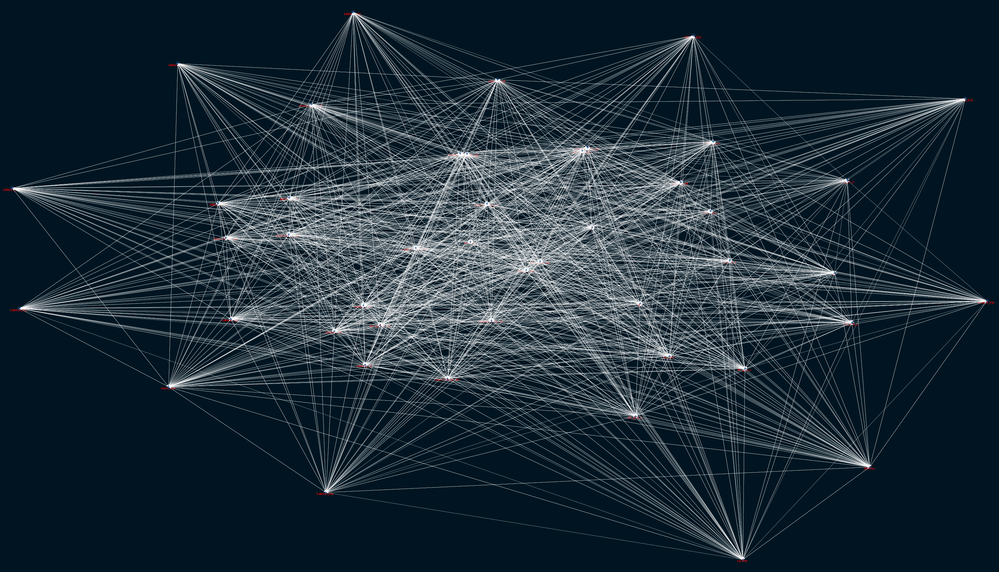

In [7]:
mean = 2.613476e-06
a.reset_threshold(mean)
viz = a.get_graph(specific_nodes=batteries_tmp)
Image(viz.draw(format="png"))

In [9]:
# Demasiadas relaciones, eliminamos las aristas cuyo nodo destino no son la temperatura de baterías que es lo que nos interesa analizar ahora mismo.


edges = a.get_all_edges()
print(len(edges))
edges = [(u, v) for u, v, w in edges if v not in batteries_tmp]
a.remove_edges(edges=edges)
edges = a.get_all_edges()

272


Run Image(result.draw(format='png')) to draw the graph


C:\ProgramData\Anaconda3\lib\site-packages\pygraphviz\agraph.py:1400: RuntimeWarning: Warning: node 'atmelPwr_volt', graph '' size too small for label

  warnings.warn(b"".join(errors).decode(self.encoding), RuntimeWarning)
C:\ProgramData\Anaconda3\lib\site-packages\pygraphviz\agraph.py:1400: RuntimeWarning: Warning: node 'atmelPwr_volt', graph '' size too small for label

  warnings.warn(b"".join(errors).decode(self.encoding), RuntimeWarning)


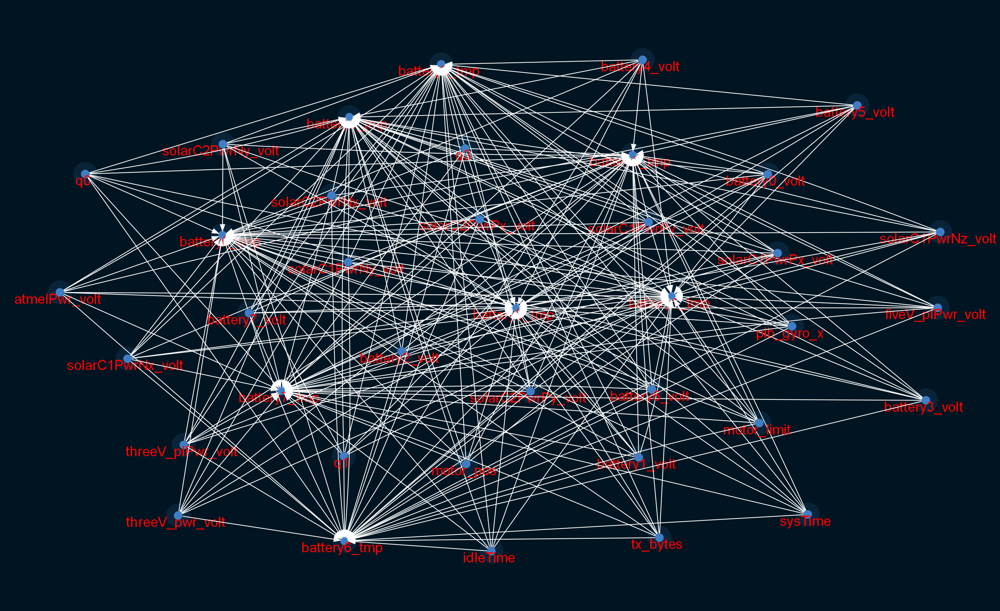

In [10]:

viz = a.get_graph(specific_nodes=batteries_tmp)
Image(viz.draw(format="png"))

Run Image(result.draw(format='png')) to draw the graph


C:\ProgramData\Anaconda3\lib\site-packages\pygraphviz\agraph.py:1400: RuntimeWarning: Warning: node 'atmelPwr_volt', graph '' size too small for label

  warnings.warn(b"".join(errors).decode(self.encoding), RuntimeWarning)


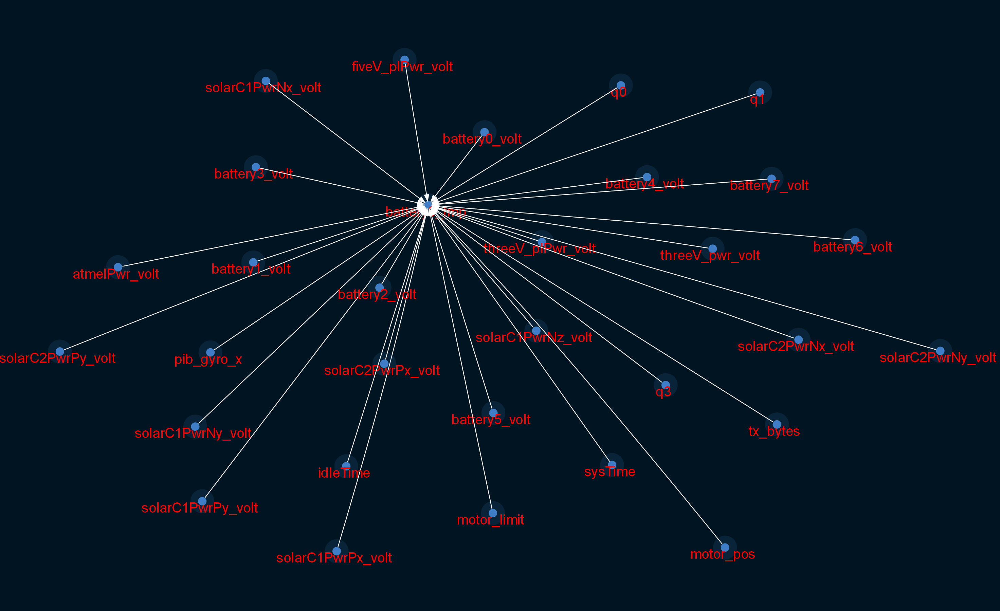

In [11]:
# Nos centramos en una batería para visualizarlo con más claridad

viz = a.get_graph(specific_nodes=["battery0_tmp"])
Image(viz.draw(format="png"))

In [12]:
# Si comprobamos el dataset con las aristas, vemos que todas las relaciones que nos quedan tienen un peso similar, por lo que podemos concluir que las variables
# que más afectan a la temperatutra de las baterías son  las siguientes

df = a.edges_to_dataframe(specific_nodes=["battery0_tmp"])
df

,source,target,weight
0,atmelPwr_volt,battery0_tmp,0.000005
1,threeV_plPwr_volt,battery0_tmp,0.000003
2,fiveV_plPwr_volt,battery0_tmp,0.000007
3,threeV_pwr_volt,battery0_tmp,0.000005
4,solarC1PwrNx_volt,battery0_tmp,0.000004
5,solarC2PwrNx_volt,battery0_tmp,0.000004
6,solarC1PwrPx_volt,battery0_tmp,0.000005
7,solarC2PwrPx_volt,battery0_tmp,0.000005
8,solarC1PwrNy_volt,battery0_tmp,0.000005
9,solarC2PwrNy_volt,battery0_tmp,0.000005
